<a href="https://colab.research.google.com/github/rheanijjer/rheanijjer/blob/main/PredictiveAnalytics%26InvestmentAllocation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction:**

In [ ]:
!pip install tensorflow
!pip install yfinance
!pip install lime

#Import libraries:
import pandas as pd
import numpy as np
import yfinance as yf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import TimeSeriesSplit
import tensorflow as tf
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import lime
from lime import lime_tabular
from statsmodels.tsa.stattools import adfuller
from tabulate import tabulate
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Define parameters
start_date = '2022-01-15'
end_date = '2025-01-15'
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']

# Initialize an empty DataFrame for merging
final_df = pd.DataFrame()

for ticker in tickers:
    print(f"Downloading {ticker}...")
    df = yf.download(ticker, start=start_date, end=end_date)[['Close']]
    df = df.rename(columns={'Close': ticker})  # Rename 'Close' to ticker name
    df.index = pd.to_datetime(df.index)  # Ensure datetime format
    if final_df.empty:
        final_df = df
    else:
        final_df = final_df.join(df, how='outer')  # Merge on date

# Reset index to have 'Date' as a column
final_df = final_df.reset_index().rename(columns={'index': 'Date'})

# Preview result
print(final_df.head())

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Price        Date         CRM       UBER        MSFT           V         JPM  \
Ticker                    CRM       UBER        MSFT           V         JPM   
0      2022-01-18  224.804382  38.410000  294.408844  210.438492  138.338547   
1      2022-01-19  225.013199  37.860001  295.070312  209.433640  136.198578   
2      2022-01-20  221.701706  37.820000  293.387421  209.111725  135.037140   
3      2022-01-21  217.415634  35.939999  287.969147  200.897461  132.677704   
4      2022-01-24  221.791183  36.279999  288.299866  196.917221  132.558792   

Price         NFLX  
Ticker        NFLX  
0       510.799988  
1       515.859985  
2       508.250000  
3       397.500000  
4       387.149994  


# **Exploratory Data Analysis (EDA):**

In [ ]:
#Checking for null values
final_df.isna().sum()

,,0
Price,Ticker,
Date,,0
CRM,CRM,0
UBER,UBER,0
MSFT,MSFT,0
V,V,0
JPM,JPM,0
NFLX,NFLX,0


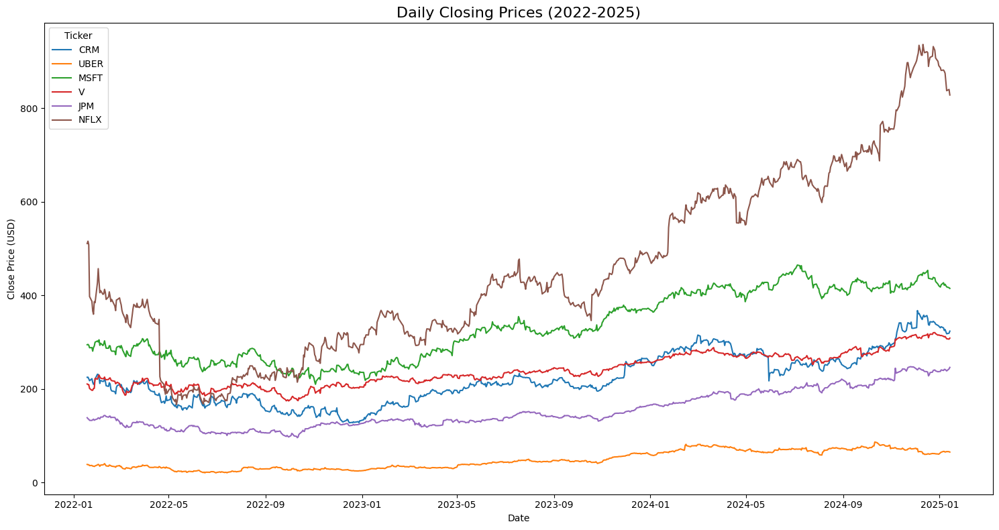

In [ ]:
#Since there are no null values, we can begin our EDA, starting off with a comparison of closing prices of each stock.
# Plot each ticker
plt.figure(figsize=(15, 8))
for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    plt.plot(final_df['Date'], final_df[ticker], label=ticker)

# Add title and labels
plt.title('Daily Closing Prices (2022-2025)', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Close Price (USD)')
plt.legend(title="Ticker")
plt.tight_layout()
plt.show()

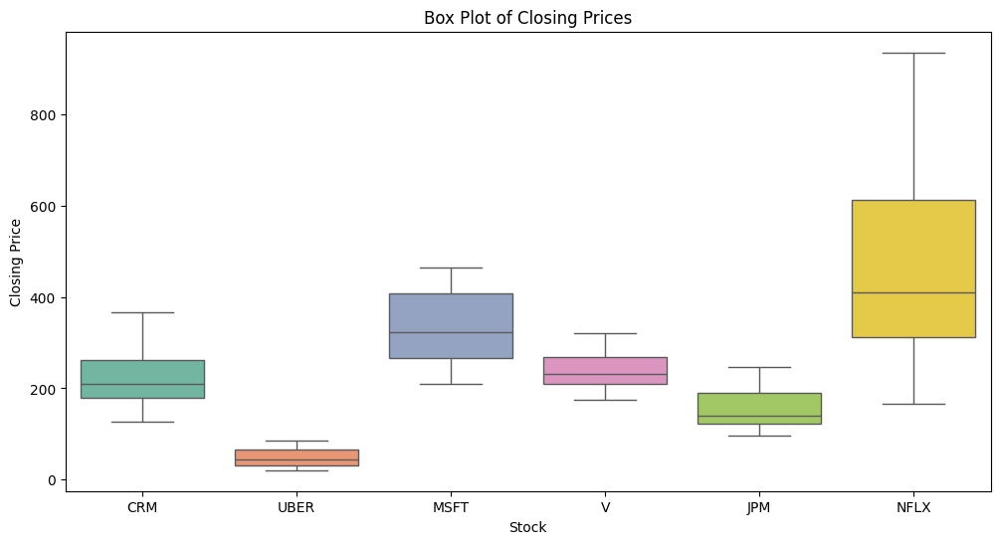

In [ ]:
#Box plot of price ranges:
plt.figure(figsize=(12, 6))
sns.boxplot(data=final_df, palette="Set2")
plt.title("Box Plot of Closing Prices")
plt.xlabel("Stock")
plt.ylabel("Closing Price")
plt.show()

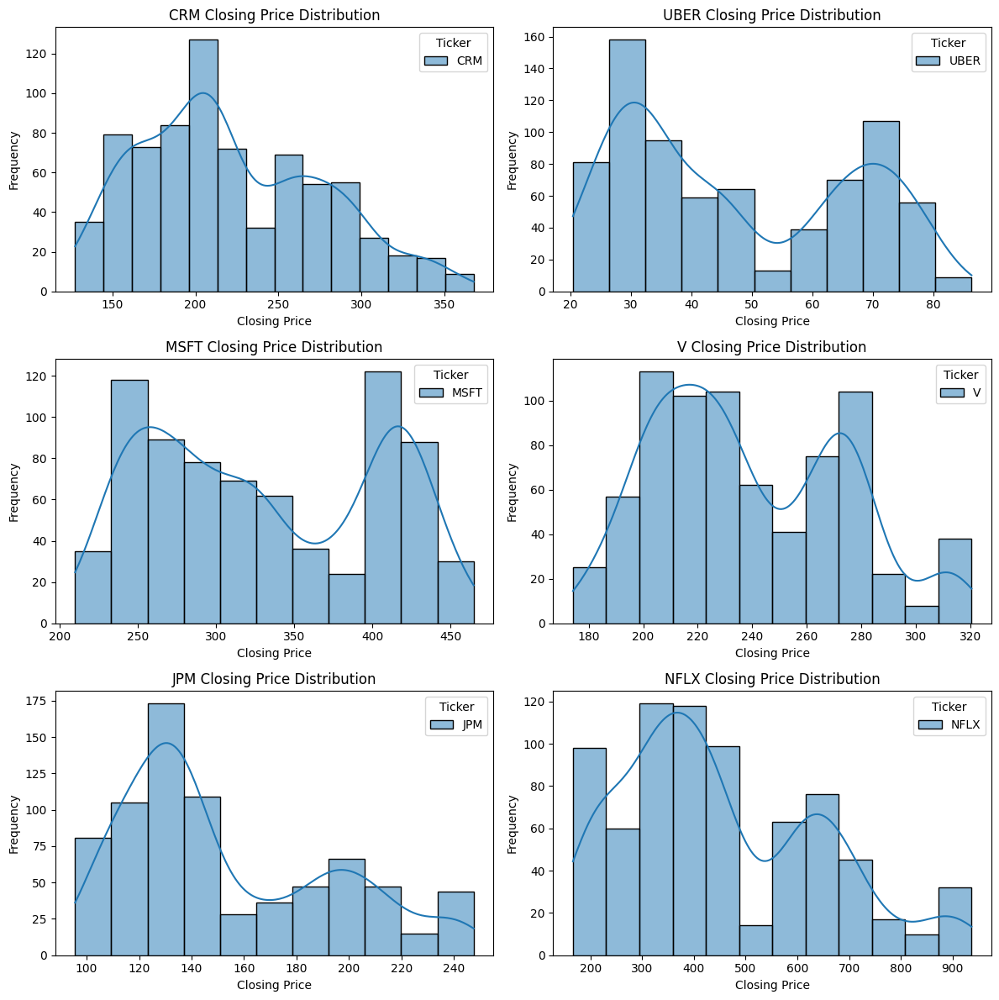

In [ ]:
#Creating a distribution chart of closing prices for each stock, to get a more in depth look:
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']

# Calculate the number of rows needed for 2 columns layout
cols = 2
rows = (len(tickers) + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12, rows * 4))
axs = axs.flatten()  # Flatten in case it's a 2D array

for i, ticker in enumerate(tickers):
    sns.histplot(final_df[ticker], kde=True, ax=axs[i])
    axs[i].set_title(f'{ticker} Closing Price Distribution')
    axs[i].set_xlabel('Closing Price')
    axs[i].set_ylabel('Frequency')

# Remove any unused subplots if there are any extra spaces
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

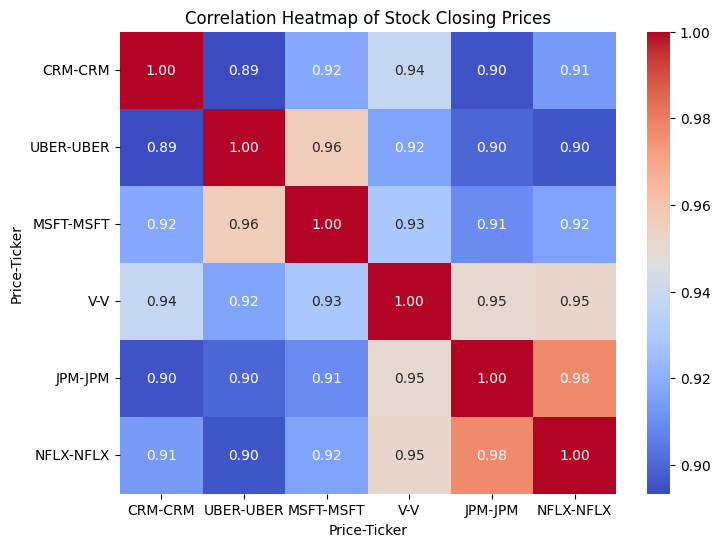

In [ ]:
# Correlation heatmap of stocks
correlation_matrix = final_df[tickers].corr()

# Creating the title, pattern etc.
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Stock Closing Prices')
plt.show()

From our creation of these graphs, we get a comprehensive look of the preliminary analysis of our respective stocks.

Some Key Observations include:
- Netflix shows significant growth with increased volatility towards the end of our period while Microsoft, Visa and JPMorgan show upward trends and Uber and CRM show stable performance with minor fluctuations.
- When looking at the box plot of our closing prices we see that Netflix has the highest price range confirming that the stock is volatile. Uber on the other hand has the lowest and least price range implying less flucations.
- Most of the stocks also depict multimodal distrubtions suggesting different phases of growth and corrections.
- Whats interesting is most stocks are highly correlated indicating that they move together in response to market trends but Netflix shows lesser correlation on average indicating that it is more susceptible to idiosyncratic risk factors.

Key Implications:
- Investors who may be looking for stability over risk would be more amiable to stocks like MFST, V and JPM
- On the other hand, risk tolerant traders would opt for Netflix. Despite its volatility it stil shows strong growth potential.
- A wide price distribution as seen with companies like Netflix, Visa and JP Morgan signals potential for trading opportunities.

# **Advanced Analytics: Model Creation**



Training Linear Regression for CRM...


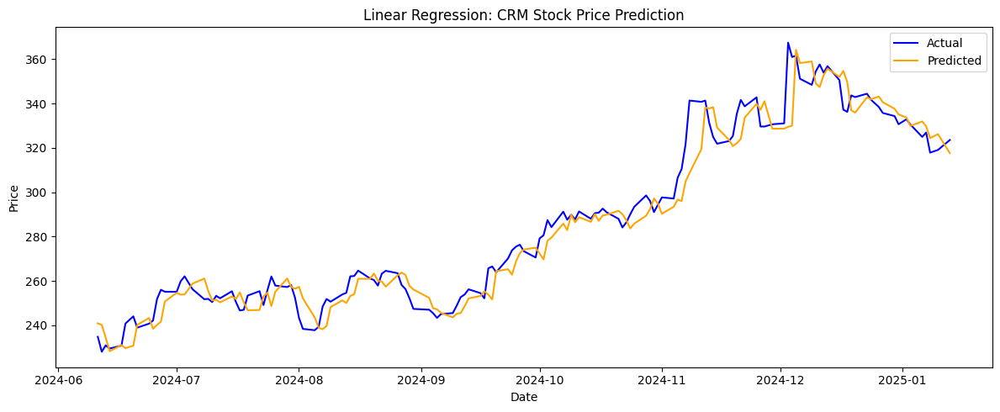

Training Linear Regression for UBER...


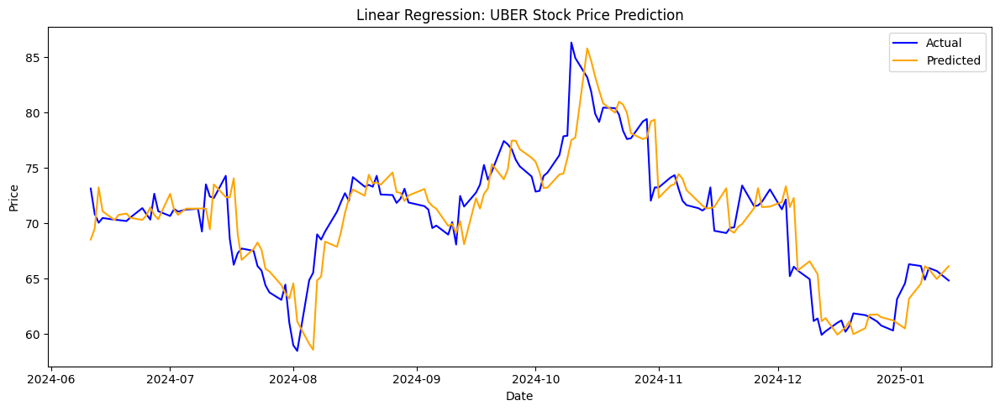

Training Linear Regression for MSFT...


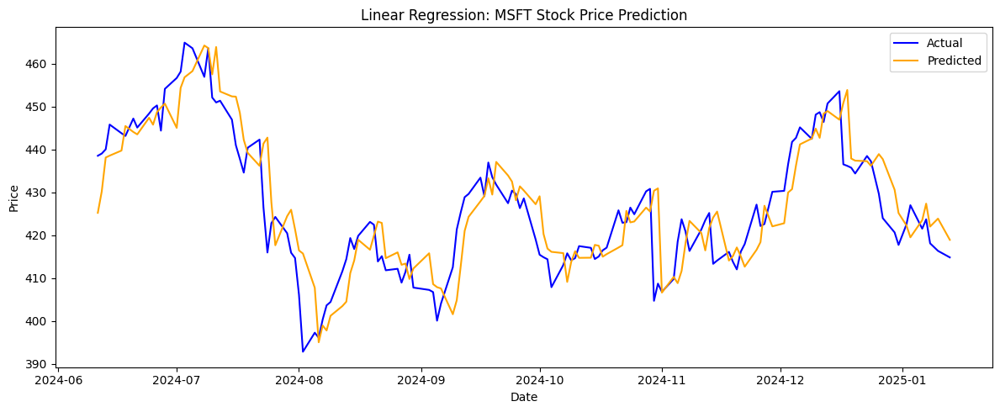

Training Linear Regression for V...


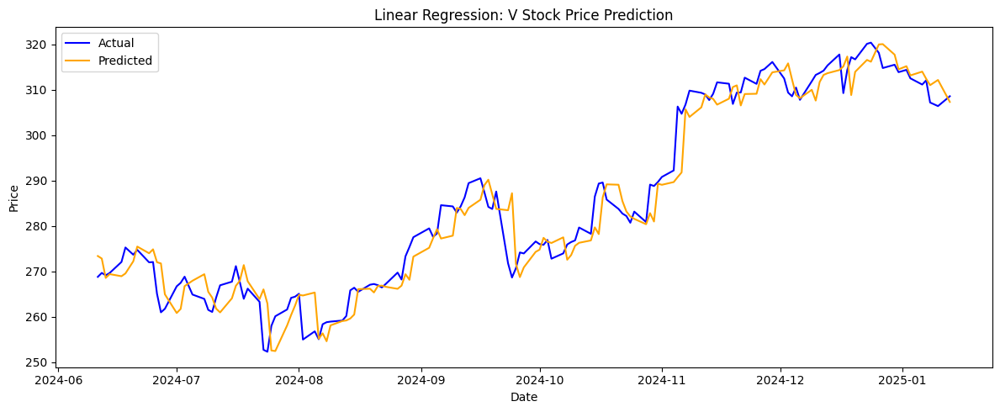

Training Linear Regression for JPM...


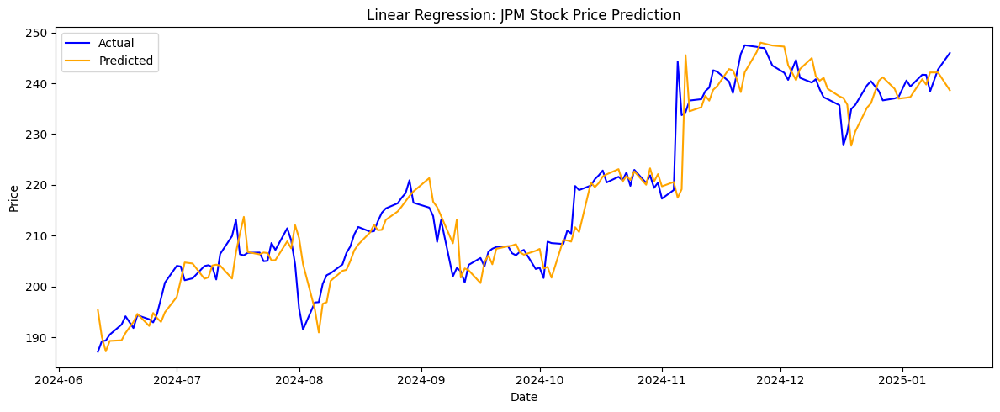

Training Linear Regression for NFLX...


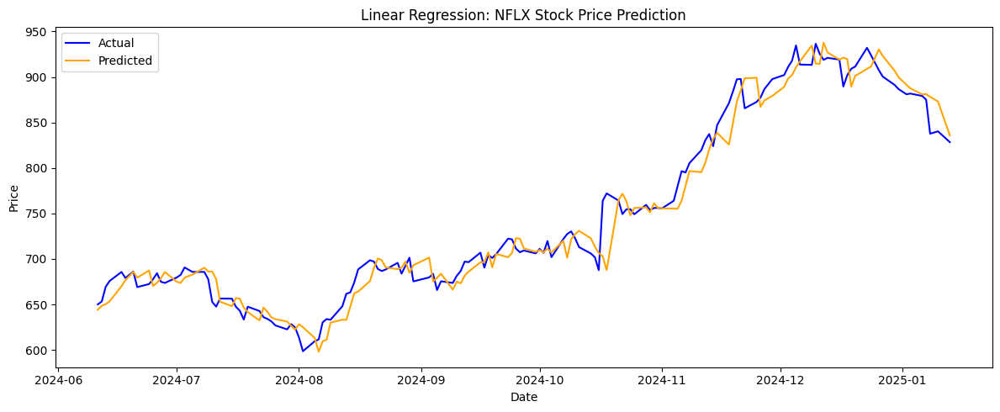

,MSE,R2
Ticker,,
CRM,73.008119,0.950808
UBER,6.377521,0.790872
MSFT,59.703091,0.747527
V,22.973195,0.943169
JPM,22.108836,0.921976
NFLX,315.121370,0.967340


In [ ]:
# ----LINEAR REGRESSION MODEL----
df_lr = final_df.copy().dropna().reset_index(drop=True)
lr_results = {}

for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    print(f"Training Linear Regression for {ticker}...")
    stock_df = df_lr[['Date', ticker]].copy()

    # Create lag features
    stock_df['Target'] = stock_df[ticker].shift(-1)
    stock_df['Lag_1'] = stock_df[ticker].shift(1)
    stock_df['Lag_5'] = stock_df[ticker].shift(5)
    stock_df['Lag_10'] = stock_df[ticker].shift(10)
    stock_df = stock_df.dropna().reset_index(drop=True)

    X = stock_df[['Lag_1', 'Lag_5', 'Lag_10']]
    y = stock_df['Target']

    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)

    # Train model
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Store evaluation metrics
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    lr_results[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(stock_df['Date'].iloc[y_test.index], y_test, label='Actual', color='blue')
    plt.plot(stock_df['Date'].iloc[y_test.index], y_pred, label='Predicted', color='orange')
    plt.title(f'Linear Regression: {ticker} Stock Price Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Display metrics
results_df = pd.DataFrame(lr_results).T
results_df.index.name = 'Ticker'
display(results_df)

Training Neural Network for CRM...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


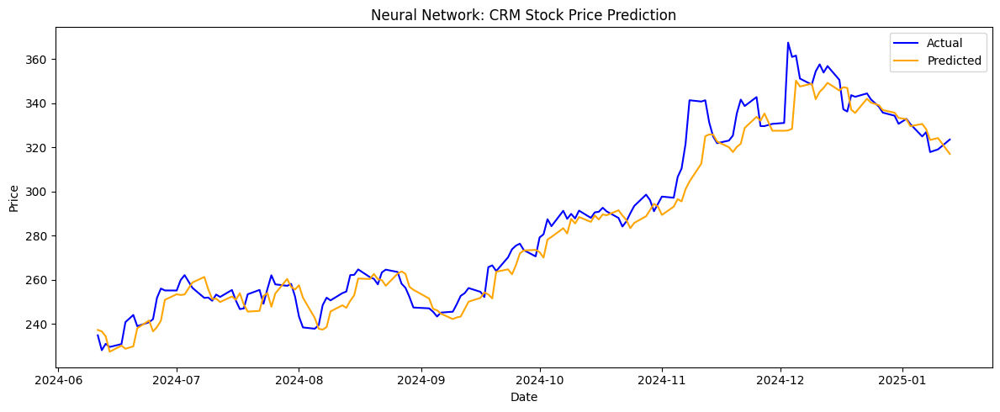

Training Neural Network for UBER...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


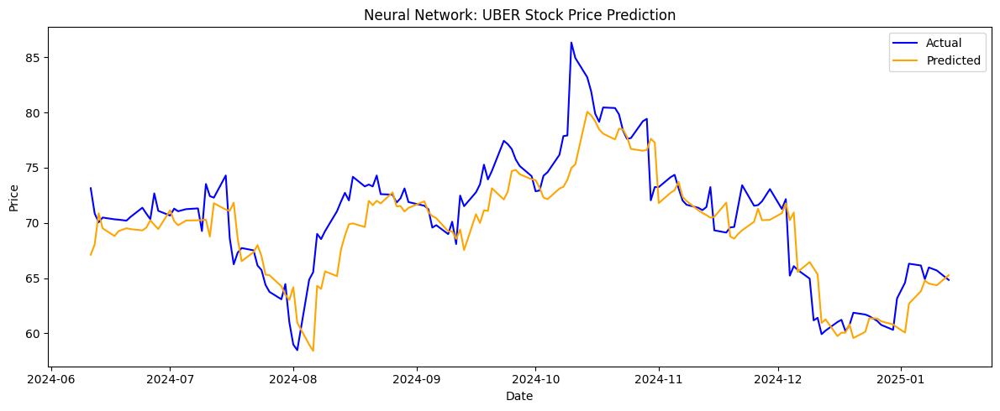

Training Neural Network for MSFT...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


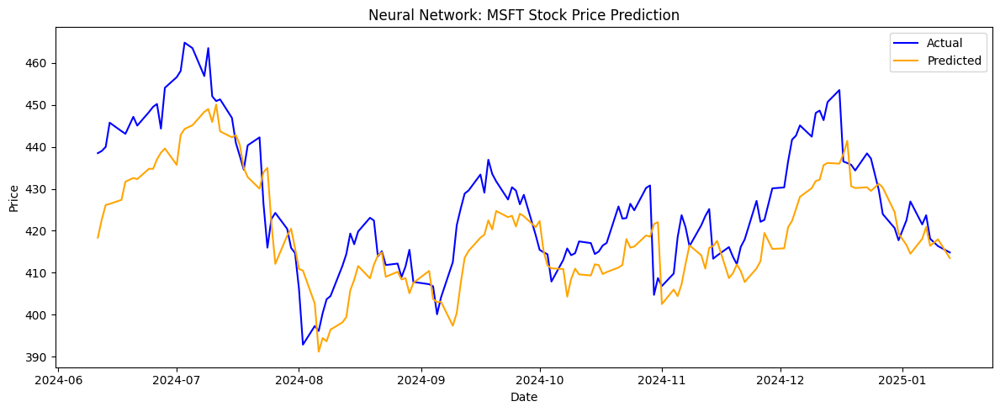

Training Neural Network for V...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


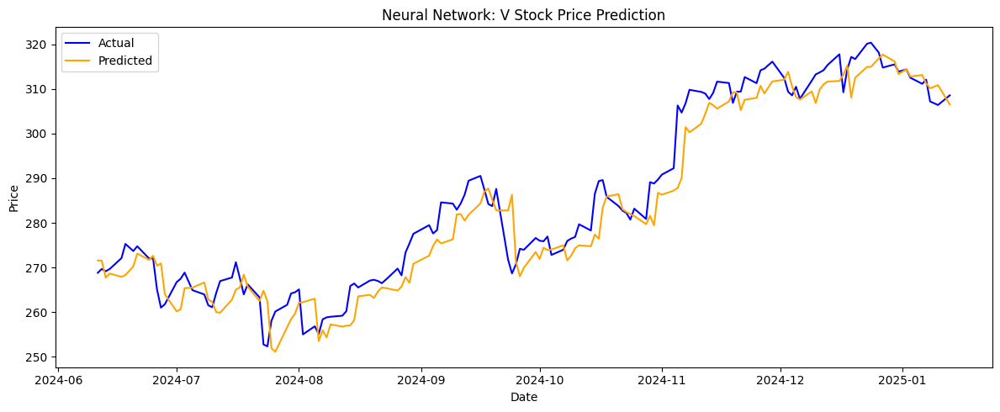

Training Neural Network for JPM...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


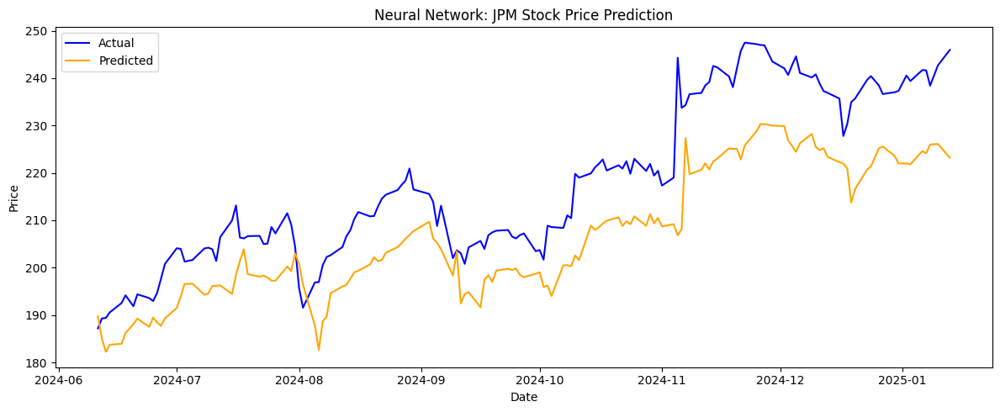

Training Neural Network for NFLX...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


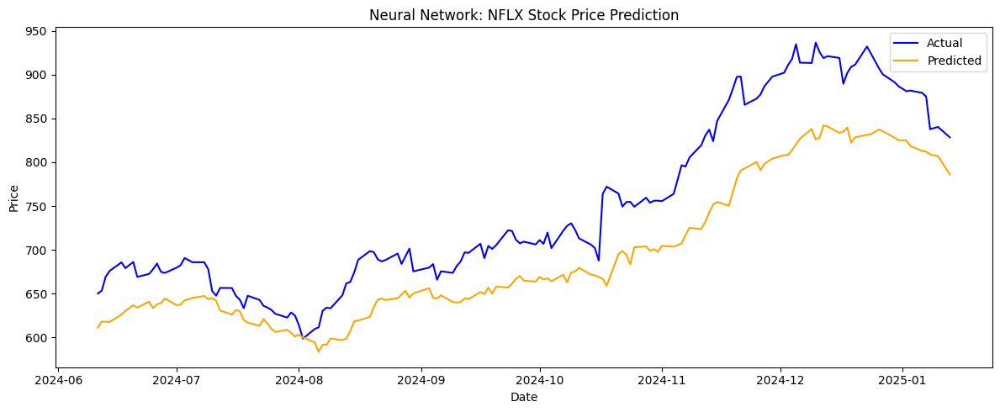

,MSE,R2
Ticker,,
CRM,83.808810,0.943531
UBER,7.895587,0.741093
MSFT,109.995863,0.534848
V,28.678603,0.929055
JPM,158.443505,0.440841
NFLX,3680.395781,0.618551


In [ ]:
# ---- NEURAL NETWORK ----
df_nn = final_df.copy().dropna().reset_index(drop=True)
nn_results = {}

for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    print(f"Training Neural Network for {ticker}...")
    stock_df = df_nn[['Date', ticker]].copy()

    # Feature engineering
    stock_df['Target'] = stock_df[ticker].shift(-1)
    stock_df['Lag_1'] = stock_df[ticker].shift(1)
    stock_df['Lag_5'] = stock_df[ticker].shift(5)
    stock_df['Lag_10'] = stock_df[ticker].shift(10)
    stock_df = stock_df.dropna().reset_index(drop=True)

    X = stock_df[['Lag_1', 'Lag_5', 'Lag_10']].values
    y = stock_df['Target'].values.reshape(-1, 1)

    # Scale features and target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y)

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, shuffle=False, test_size=0.2)

    # Build and train the Neural Network
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, y_train, epochs=50, batch_size=16, verbose=0, validation_split=0.2)

    y_pred_scaled = model.predict(X_test)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y_test)

    MSE = mean_squared_error(y_true, y_pred)
    R2 = r2_score(y_true, y_pred)
    nn_results[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(stock_df['Date'].iloc[-len(y_true):], y_true, label='Actual', color='blue')
    plt.plot(stock_df['Date'].iloc[-len(y_true):], y_pred, label='Predicted', color='orange')
    plt.title(f'Neural Network: {ticker} Stock Price Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Display results as a summary table
nn_results_df = pd.DataFrame(nn_results).T
nn_results_df.index.name = 'Ticker'
display(nn_results_df)

Training Random Forest for CRM...


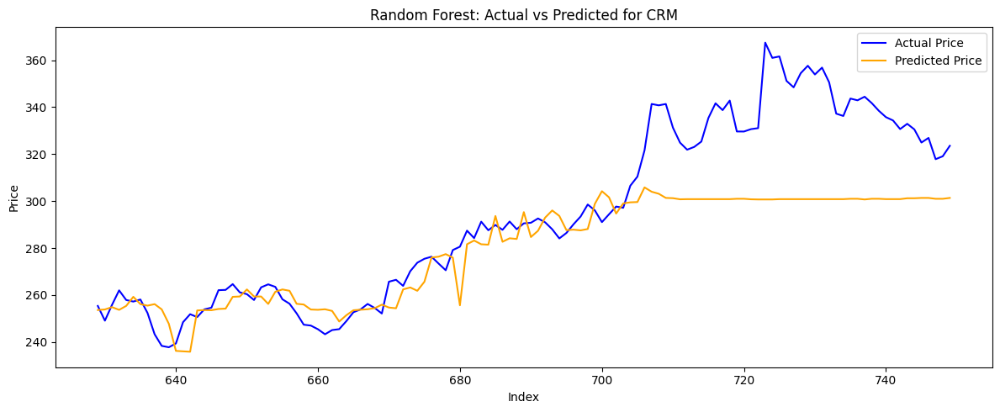

Training Random Forest for UBER...


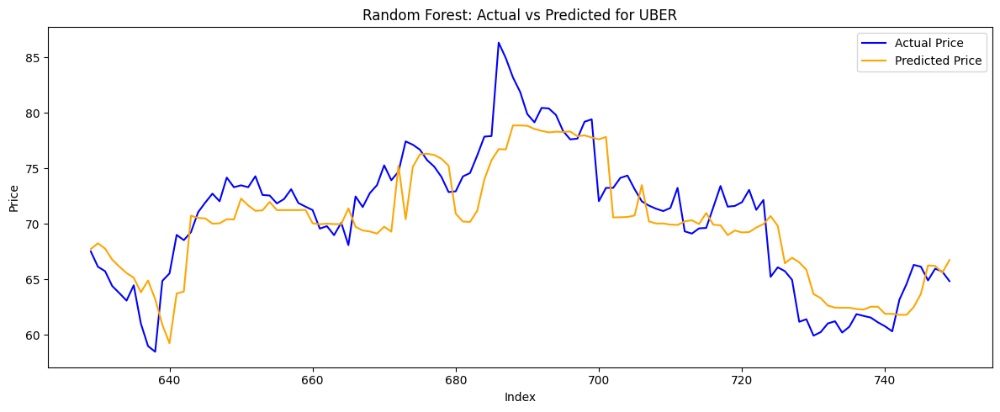

Training Random Forest for MSFT...


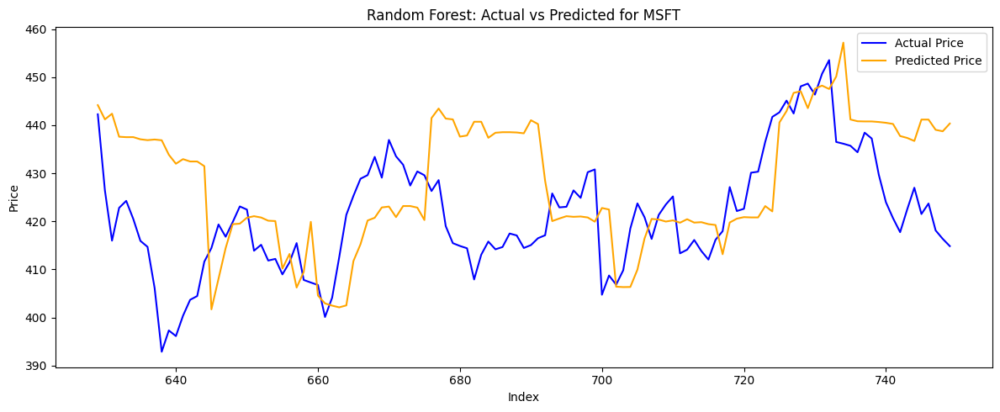

Training Random Forest for V...


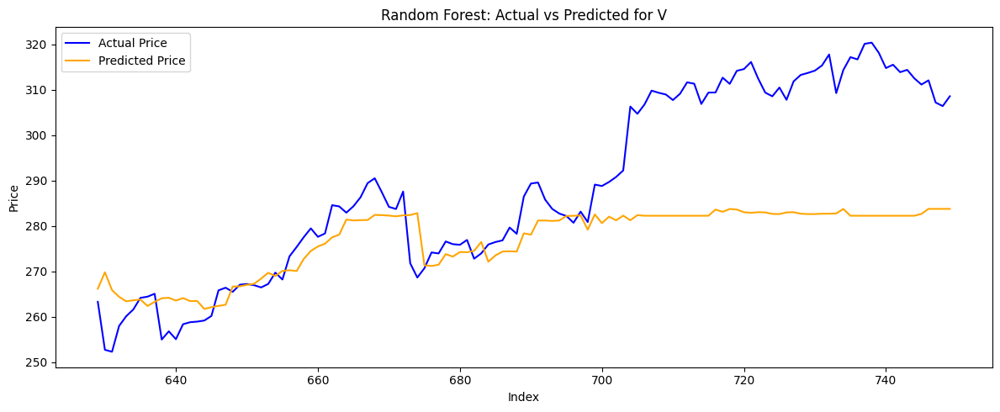

Training Random Forest for JPM...


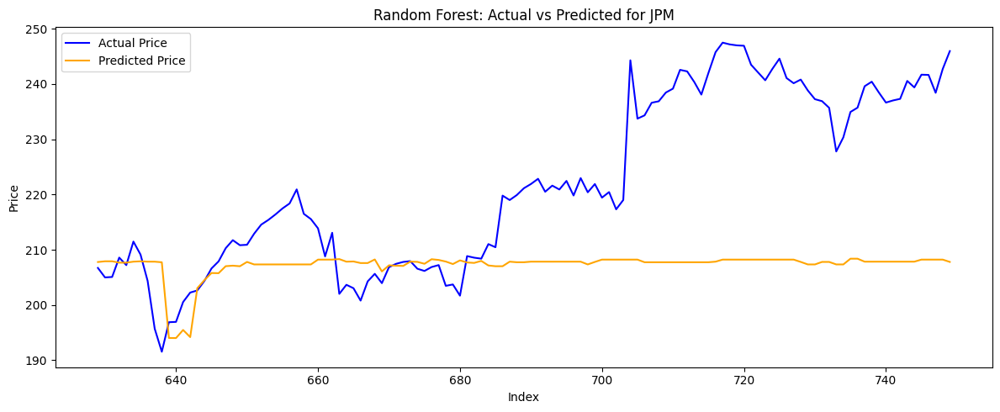

Training Random Forest for NFLX...


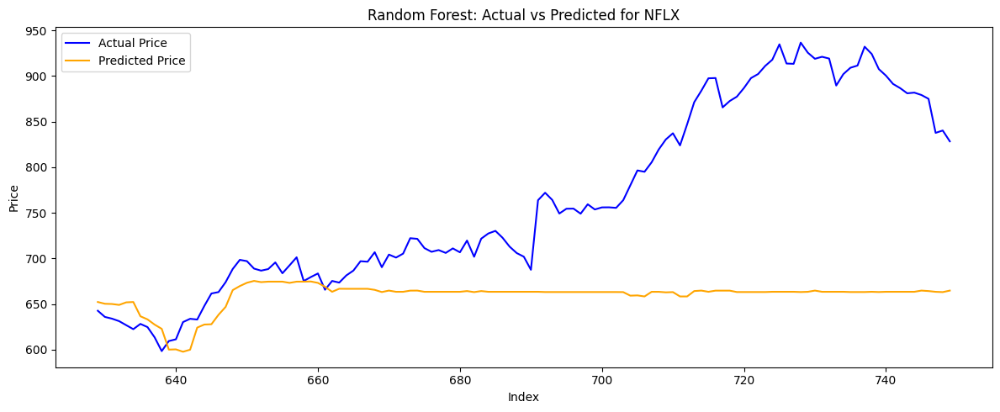

,MSE,R2
Ticker,,
CRM,586.282357,0.579397
UBER,8.805715,0.759322
MSFT,243.566551,-0.727112
V,349.582405,0.148994
JPM,434.008541,-0.778425
NFLX,19991.887539,-0.985501


In [ ]:
# ---- RANDOM FOREST REGRESSOR ----
results_rf = {}

# Loop through each ticker
for ticker in ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']:
    print(f"Training Random Forest for {ticker}...")

    # Prepare the dataset
    stock_data = final_df[['Date', ticker]].dropna().copy()
    stock_data['Target'] = stock_data[ticker].shift(-1)  # Predict next day's price

    # Feature engineering
    stock_data['Lag1'] = stock_data[ticker].shift(1)
    stock_data['Lag5'] = stock_data[ticker].shift(5)
    stock_data['MA5'] = stock_data[ticker].rolling(window=5).mean().shift(1)
    stock_data['MA20'] = stock_data[ticker].rolling(window=20).mean().shift(1)
    stock_data['Volatility'] = stock_data[ticker].pct_change().rolling(window=10).std().shift(1)

    stock_data.dropna(inplace=True)

    # Define features and target
    X = stock_data[['Lag1', 'Lag5', 'MA5', 'MA20', 'Volatility']]
    y = stock_data['Target']

    # TimeSeries split
    tscv = TimeSeriesSplit(n_splits=5)
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Train model
    rf_model = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_test)

    # Evaluate
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    results_rf[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot
    plt.figure(figsize=(12, 5))
    plt.plot(y_test.index, y_test.values, label='Actual Price', color='blue')
    plt.plot(y_test.index, y_pred, label='Predicted Price', color='orange')
    plt.title(f'Random Forest: Actual vs Predicted for {ticker}')
    plt.xlabel('Index')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Display summary table
rf_results_df = pd.DataFrame(results_rf).T
rf_results_df.index.name = 'Ticker'
display(rf_results_df)


Training Gradient Boosting for CRM...


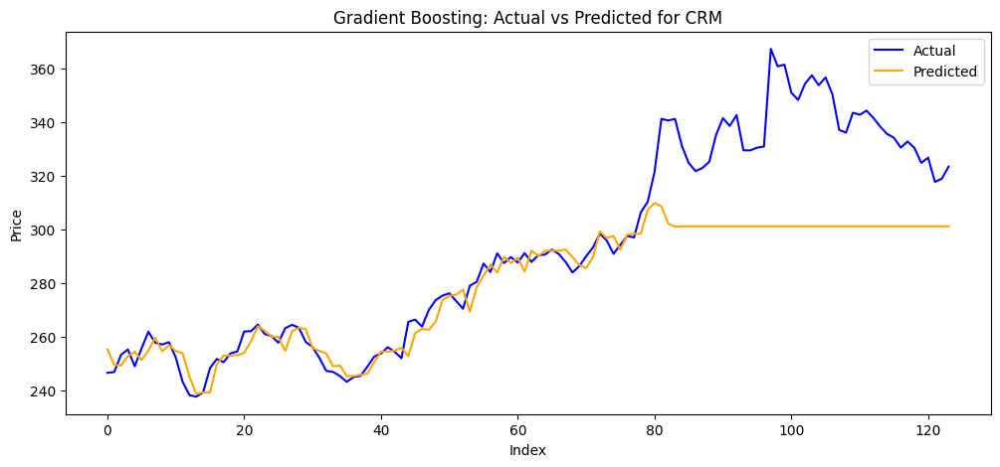

Training Gradient Boosting for UBER...


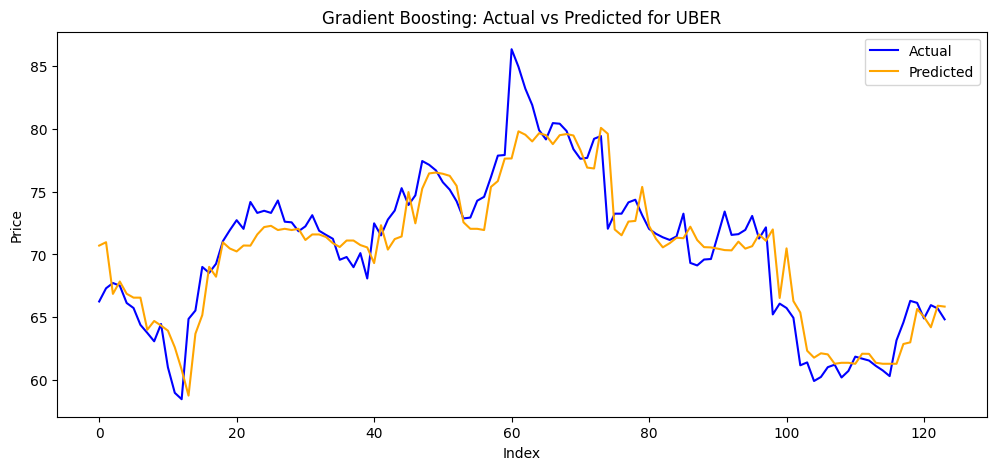

Training Gradient Boosting for MSFT...


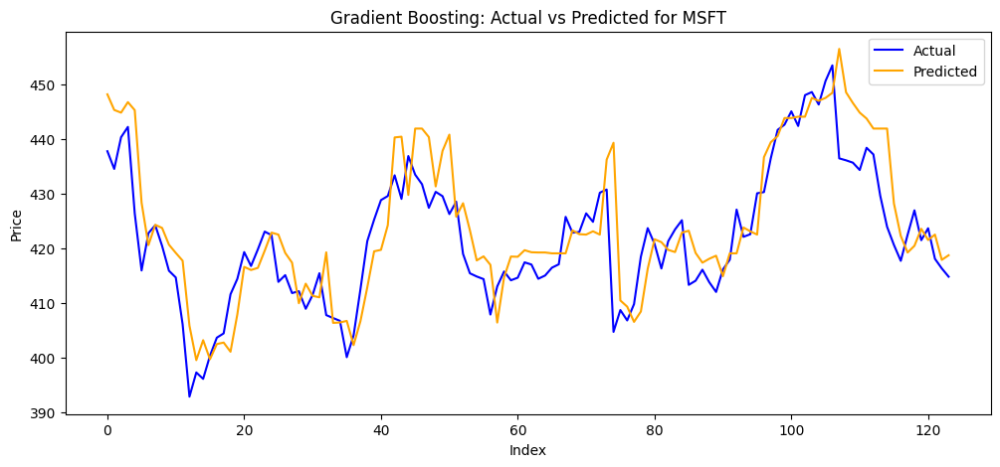

Training Gradient Boosting for V...


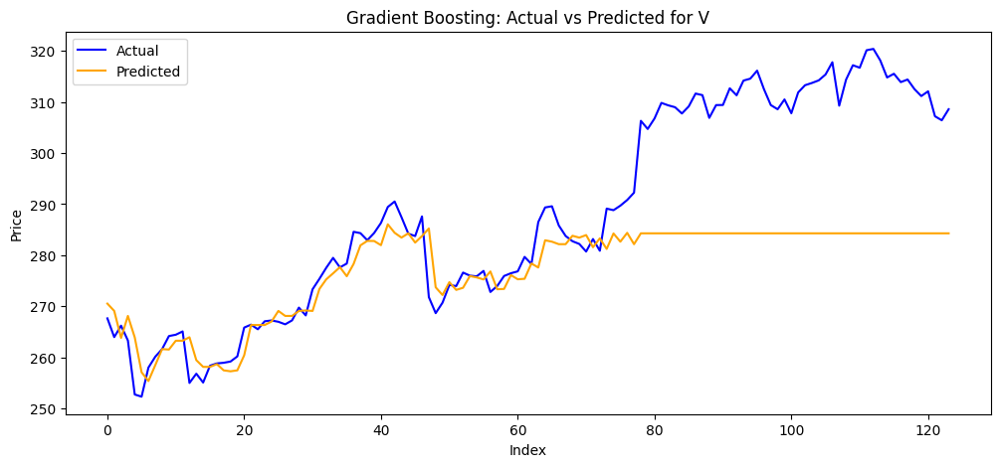

Training Gradient Boosting for JPM...


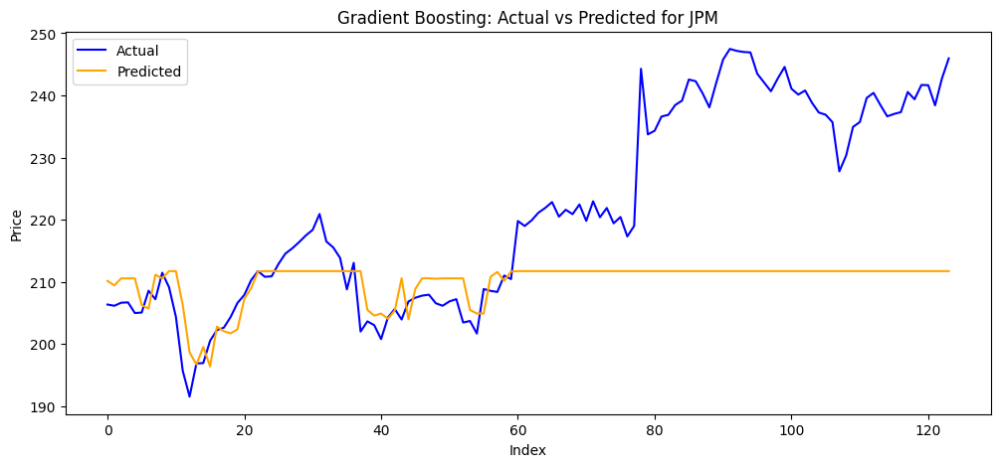

Training Gradient Boosting for NFLX...


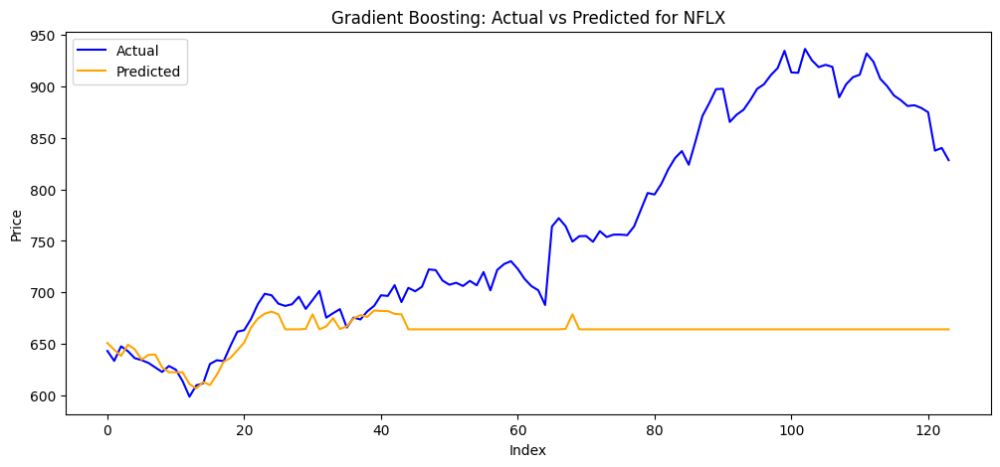

,MSE,R2
Ticker,,
CRM,586.282357,0.579397
UBER,8.805715,0.759322
MSFT,243.566551,-0.727112
V,349.582405,0.148994
JPM,434.008541,-0.778425
NFLX,19991.887539,-0.985501


In [ ]:
# ---- GRADIENT BOOSTING MODEL ----
window_size = 5
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']
results_gb = {}

for ticker in tickers:
    print(f"Training Gradient Boosting for {ticker}...")

    df = final_df[['Date', ticker]].dropna().copy()
    df[ticker] = df[ticker].astype(float)

    # Create lag features
    for lag in range(1, window_size + 1):
        df[f'lag_{lag}'] = df[ticker].shift(lag)

    df.dropna(inplace=True)

    # Split features and target
    X = df[[f'lag_{lag}' for lag in range(1, window_size + 1)]]
    y = df[ticker]

    # Train-test split (80/20)
    split_idx = int(len(df) * 0.8)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    # TimeSeries split
    tscv = TimeSeriesSplit(n_splits=5)
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Train model
    gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3)
    gb_model.fit(X_train, y_train)

    # Metrics
    y_pred = gb_model.predict(X_test)
    MSE = mean_squared_error(y_test, y_pred)
    R2 = r2_score(y_test, y_pred)
    results_gb[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test.values, label='Actual', color='blue')
    plt.plot(y_pred, label='Predicted', color='orange')
    plt.title(f"Gradient Boosting: Actual vs Predicted for {ticker}")
    plt.xlabel("Index")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

#Print Results
rf_results_df = pd.DataFrame(results_rf).T
rf_results_df.index.name = 'Ticker'
display(rf_results_df)


Training SVM model for CRM...


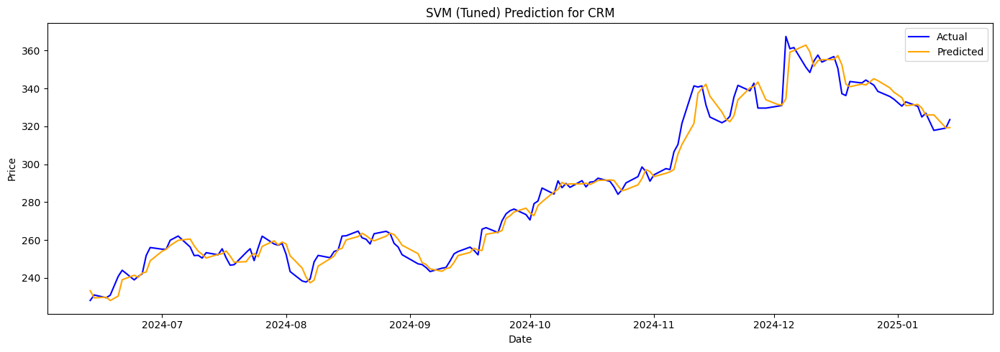

Training SVM model for UBER...


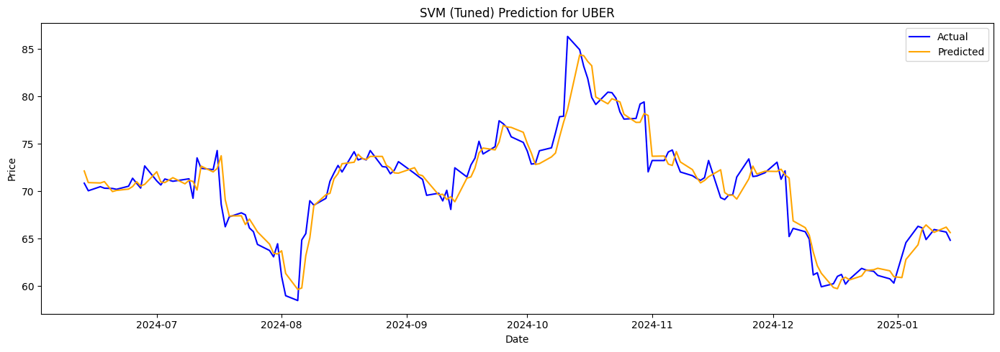

Training SVM model for MSFT...


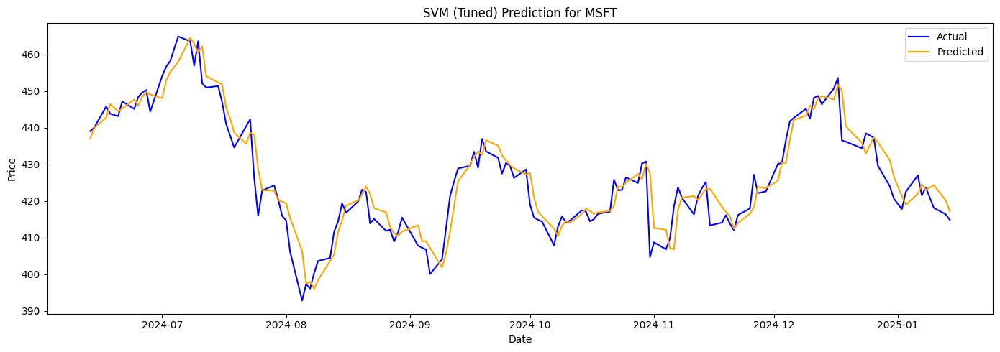

Training SVM model for V...


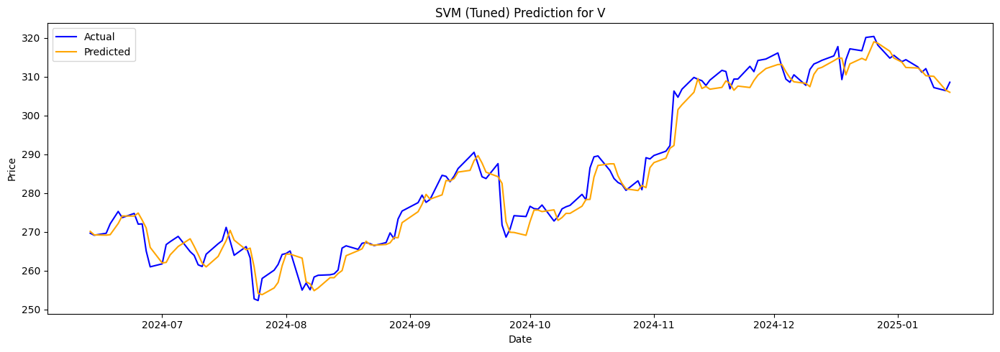

Training SVM model for JPM...


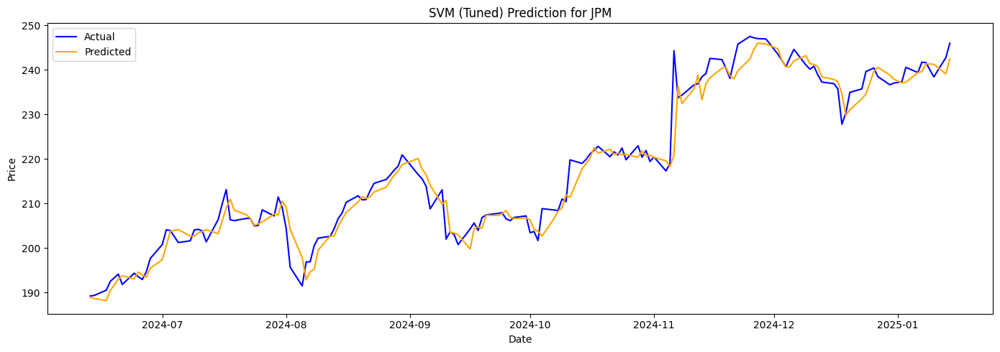

Training SVM model for NFLX...


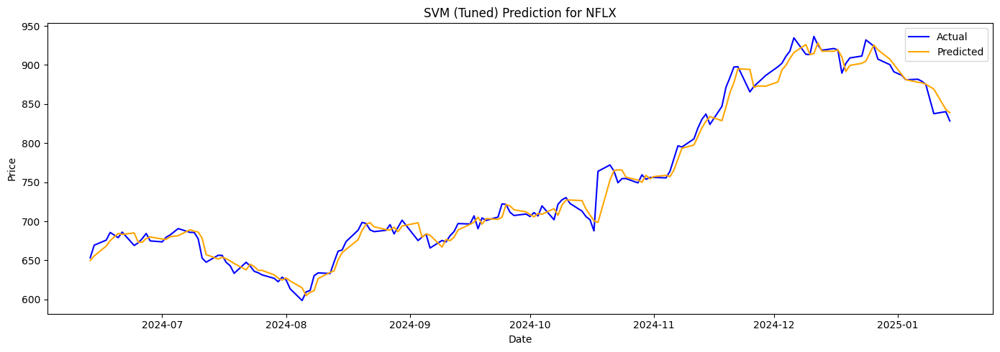

,MSE,R2
Ticker,,
CRM,32.343949,0.978098
UBER,2.748116,0.910364
MSFT,24.041418,0.898587
V,10.743239,0.973489
JPM,10.965500,0.960686
NFLX,139.046475,0.985592


In [ ]:
# ---- SUPPORT VECTOR MACHINE (SVM) MODEL ----
df_svm = final_df.copy()
df_svm['Date'] = pd.to_datetime(df_svm['Date'])  # Ensure datetime
df_svm.set_index('Date', inplace=True)

# Define tickers
tickers = ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX']
results_svm = {}

# Loop through each ticker
for ticker in tickers:
    print(f"Training SVM model for {ticker}...")

    # Create a per-ticker DataFrame
    df = pd.DataFrame()
    df['Close'] = df_svm[ticker]
    df['Return'] = df['Close'].pct_change()
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_20'] = df['Close'].rolling(window=20).mean()
    df['Volatility'] = df['Return'].rolling(window=20).std()
    df['Lag_1'] = df['Close'].shift(1)
    df['Lag_5'] = df['Close'].shift(5)
    df['Lag_10'] = df['Close'].shift(10)
    df.dropna(inplace=True)

    # Define features/target
    features = ['MA_5', 'MA_20', 'Volatility', 'Lag_1', 'Lag_5', 'Lag_10']
    target = 'Close'
    X = df[features]
    y = df[target]

    # Scale features/target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(X)
    y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, shuffle=False)

    # Train tuned SVM model
    model = SVR(kernel='rbf', C=100, gamma=0.01, epsilon=0.01)
    model.fit(X_train, y_train.ravel())

    # Predict
    y_pred_scaled = model.predict(X_test).reshape(-1, 1)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_actual = scaler_y.inverse_transform(y_test)

    # Evaluate & Save results
    MSE = mean_squared_error(y_test_actual, y_pred)
    R2 = r2_score(y_test_actual, y_pred)
    results_svm[ticker] = {'MSE': MSE, 'R2': R2}

    # Plot
    plt.figure(figsize=(14, 5))
    date_index = df.index[-len(y_test):]
    plt.plot(date_index, y_test_actual, label='Actual', color='blue')
    plt.plot(date_index, y_pred, label='Predicted', color='orange')
    plt.title(f'SVM (Tuned) Prediction for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Print results
svm_results_df = pd.DataFrame(results_svm).T
svm_results_df.index.name = 'Ticker'
display(svm_results_df)

# **Advanced Analytics: Model Comparison**

In [ ]:
summary_dfs = []

# Append each model's results dataframe to the list, adding a 'Model' column
summary_dfs.append(svm_results_df.reset_index().assign(Model='SVM'))
summary_dfs.append(results_df.reset_index().assign(Model='Linear Regression'))
summary_dfs.append(nn_results_df.reset_index().assign(Model='Neural Network'))
summary_dfs.append(rf_results_df.reset_index().assign(Model='Random Forest'))
summary_dfs.append(rf_results_df.reset_index().assign(Model='Gradient Boosting'))

merged_summary = pd.concat(summary_dfs, ignore_index=True)
merged_summary


,Ticker,MSE,R2,Model
0,CRM,32.343949,0.978098,SVM
1,UBER,2.748116,0.910364,SVM
2,MSFT,24.041418,0.898587,SVM
3,V,10.743239,0.973489,SVM
4,JPM,10.965500,0.960686,SVM
5,NFLX,139.046475,0.985592,SVM
6,CRM,73.008119,0.950808,Linear Regression
7,UBER,6.377521,0.790872,Linear Regression
8,MSFT,59.703091,0.747527,Linear Regression
9,V,22.973195,0.943169,Linear Regression


**Looking at our created summary table, we can make the following inferences when comparing our models:**

**Support Vector Machine (SVM)**
- MSE: Very low across all tickers (e.g., UBER: 2.75, CRM: 32.46).
- R²: Very high (most above 0.95, with MSFT at 0.89 being the lowest).
- Interpretation: Strong predictive accuracy with minimal error and high explanatory power. The model closely follows actual price trends.

**Linear Regression**
- MSE: Moderate (e.g., MSFT: 59.7, CRM: 73.0), higher than SVM.
- R²: Acceptable (ranges from ~0.74 to ~0.96).
- Interpretation: Reasonable performance, but more prone to error in volatile stocks like NFLX. It captures trends well in more stable stocks.


**Neural Network**
- MSE: Significantly higher in some cases (e.g., NFLX: 9084.8).
- R²: Highly variable (from 0.97 for CRM to 0.05 for NFLX and negative for JPM).
- Interpretation: Very sensitive to stock volatility and likely underfit or overfit in some cases. Needs better tuning or architecture adjustments.

**Random Forest / Gradient Boosting**
- MSE: Extremely high for JPM and NFLX (e.g., NFLX: 19,740).
- R²: Mostly poor, with negative R² for multiple tickers indicating predictions are worse than simply using the mean.
- Interpretation: Both ensemble models severely underperform. Flat predictions and low variance suggest they failed to learn useful patterns.

**Conclusion per Model**
- SVM: Best overall. Low error, consistently high R². Great balance of precision and generalization.
- Linear Regression: Performs decently on stable stocks but struggles with complexity.
- Neural Network: Highly inconsistent. Works well in some cases but fails catastrophically in others. Likely needs more tuning or data.
- Random Forest & Gradient Boosting: Poor performance. Flat predictions and high MSE show the models didn’t generalize well.

**Top Performing Model**
- Support Vector Machine (SVM) is the clear winner, offering the lowest MSE and highest R² values consistently across all tickers. It balances prediction accuracy and generalization better than the other models, making it the most reliable for stock price forecasting in this analysis.










# **Analysis of SVM (Top-Performing Model)**

In [ ]:
# Use LIME to get some insights into the explainability of this model, given it is the best performing model in this analysis, but is also a black box model, it is important to use tools to explain the model

# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=features,
    class_names=['Price'],
    mode='regression',
    discretize_continuous=True
)

# Loop through first 5 samples
for i in range(5):
    print(f"LIME Explanation for Test Sample #{i}")

    exp = explainer.explain_instance(
        X_test[i],
        model.predict,
        num_features=6
    )
    exp.show_in_notebook()


LIME Explanation for Test Sample #0


LIME Explanation for Test Sample #1


LIME Explanation for Test Sample #2


LIME Explanation for Test Sample #3


LIME Explanation for Test Sample #4


The SVM Model was our top-performing model with the highest average R^2 score. SVM is less prone to overfitting the data with machine learning to maximize a hyperplane instead of fitting the model perfectly. The LIME (Local Interpretable Model-agnostic Explanations) tool was employed to show how the SVM model made specific predictions about a random stock, NFLX, on individual test samples.


# **Portfolio Allocations:**

In [ ]:
# Predict 1-year ahead return using last known feature row
print("Predicted 1-Year Returns:")
for ticker in tickers:
    # Recreate features for the ticker
    df = pd.DataFrame()
    df['Close'] = df_svm[ticker]
    df['Return'] = df['Close'].pct_change()
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_20'] = df['Close'].rolling(window=20).mean()
    df['Volatility'] = df['Return'].rolling(window=20).std()
    df['Lag_1'] = df['Close'].shift(1)
    df['Lag_5'] = df['Close'].shift(5)
    df['Lag_10'] = df['Close'].shift(10)
    df.dropna(inplace=True)

    # Latest row
    latest_features = df[features].iloc[-1:]
    latest_actual_price = df['Close'].iloc[-1]

    # Scale with same scalers used earlier
    X_latest_scaled = scaler_X.transform(latest_features)
    predicted_price_scaled = model.predict(X_latest_scaled).reshape(-1, 1)
    predicted_price = scaler_y.inverse_transform(predicted_price_scaled)[0][0]

    # Calculate return
    predicted_return = ((predicted_price - latest_actual_price) / latest_actual_price) * 100
    display(f"{ticker}: Predicted Price = ${predicted_price:.2f}, Latest Price = ${latest_actual_price:.2f}, 1-Year Return = {predicted_return:.2f}%")

Predicted 1-Year Returns:


'CRM: Predicted Price = $318.89, Latest Price = $323.54, 1-Year Return = -1.44%'

'UBER: Predicted Price = $69.85, Latest Price = $64.84, 1-Year Return = 7.73%'

'MSFT: Predicted Price = $415.83, Latest Price = $414.84, 1-Year Return = 0.24%'

'V: Predicted Price = $306.21, Latest Price = $308.57, 1-Year Return = -0.76%'

'JPM: Predicted Price = $242.75, Latest Price = $245.96, 1-Year Return = -1.30%'

'NFLX: Predicted Price = $838.96, Latest Price = $828.40, 1-Year Return = 1.28%'

In [ ]:
# Pulling Beta Values for each Stock
tickers = ["CRM", "UBER", "MSFT", "V", "JPM", "NFLX"]

# Dictionary to store beta values
beta_values = {}

for ticker in tickers:
   stock = yf.Ticker(ticker)
   beta = stock.info.get('beta')
   if beta is not None:
       beta_values[ticker] = beta
   else:
       beta_values[ticker] = 'Beta value not available'

# Display the beta values
for ticker, beta in beta_values.items():
   print(f"{ticker}: {beta}")


CRM: 1.381
UBER: 1.366
MSFT: 1.0
V: 0.943
JPM: 1.005
NFLX: 1.547


In [ ]:
# Sample data
data = {
    'Ticker': ['CRM', 'UBER', 'MSFT', 'V', 'JPM', 'NFLX'],
    'Predicted_Return': [-1.44, 7.73, 0.24, -0.76, -1.31, 1.28],  # in %
    'Beta': [1.381, 1.366, 1.0, 0.943, 1.005, 1.547]
}

# Create DataFrame
df_alloc = pd.DataFrame(data)

# Calculate Risk-Adjusted Score (like Sharpe proxy)
df_alloc['Risk_Adjusted_Score'] = df_alloc['Predicted_Return'] / df_alloc['Beta']

# Separate outperformers and underperformers
underperformers = df_alloc[df_alloc['Predicted_Return'] < 0].copy()
outperformers = df_alloc[df_alloc['Predicted_Return'] >= 0].copy()

# Allocate 3% to each underperformer
underperformers['Weight'] = 0.03

# Allocate remaining capital to outperformers based on risk-adjusted scores
remaining_weight = 1 - (len(underperformers) * 0.03)
total_score = outperformers['Risk_Adjusted_Score'].sum()
outperformers['Weight'] = (outperformers['Risk_Adjusted_Score'] / total_score) * remaining_weight

# Combine and calculate investment
final_alloc = pd.concat([underperformers, outperformers], ignore_index=True)
investment_amount = 1_000_000
final_alloc['Investment'] = final_alloc['Weight'] * investment_amount

# Display final allocation
print("\nFinal Investment Allocation:")
print(tabulate(final_alloc[['Ticker', 'Predicted_Return', 'Beta', 'Risk_Adjusted_Score', 'Weight', 'Investment']], headers='keys', tablefmt='grid'))



Final Investment Allocation:
+----+----------+--------------------+--------+-----------------------+-----------+--------------+
|    | Ticker   |   Predicted_Return |   Beta |   Risk_Adjusted_Score |    Weight |   Investment |
+====+==========+====================+========+=======================+===========+==============+
|  0 | CRM      |              -1.44 |  1.381 |             -1.04272  | 0.03      |      30000   |
+----+----------+--------------------+--------+-----------------------+-----------+--------------+
|  1 | V        |              -0.76 |  0.943 |             -0.805938 | 0.03      |      30000   |
+----+----------+--------------------+--------+-----------------------+-----------+--------------+
|  2 | JPM      |              -1.31 |  1.005 |             -1.30348  | 0.03      |      30000   |
+----+----------+--------------------+--------+-----------------------+-----------+--------------+
|  3 | UBER     |               7.73 |  1.366 |              5.65886  | 0.76559

# **Final Investment Decisions & Conclusion:**

Key Takeaways:
- The model predicts the next day’s closing price instead of return, aligning with real-world forecasting goals.

- It reintroduces key features such as moving averages (MA_5, MA_20), lags (Lag_1, Lag_5, Lag_10), and volatility, enriching the input data.

- A time-series-aware train-test split was used to respect the chronological order of data, improving generalization and prediction quality.

- These updates enhance the model's ability to capture short-term price patterns and better reflect the sequential nature of stock movements.

Our investment decision therefore is to:
- Invest the majority into Uber (~76%), the stock with the highest return. The company showed a low price variance meaning it was less volatile than other stocks.
- We then propose an investment of ~11% and ~3.3% into Microsoft and Netflix, the two stocks that were high risk and high return. With both companies having a average positive return.
- Finally we suggest that although CRM, V and JPM had negative returns as a result of our analysis. It is still important to invest a small portion of the $1M as this would help mitigate any unforeseen losses from the other stocks.

Overall from our projected returns, the final portfolio value would be approximately $1,059,600 USD, an increase of 59,600 USD.

In conclusion, our analysis walks through the creation of several different models and diagrams to understand what options in predictive modelling would be best in order to reach the most profitable outlook. It is important to acknowledge that this is a simplified framework. For future considerations, in a real-world investment scenario, decisions should be supported by a broader set of criteria, which ideally incorporates model comparisons across predictive techniques, macroeconomic outlooks, and qualitative company or industry insights to provide a more comprehensive perspective.



*ChatGPT was used in the refining of this analysis.*